In [1]:

import os
from collections import defaultdict

output_directory = "D:/WORK/Baybayin App Project/dataset - Copy"
# Initialize a dictionary to store the count of images per class
class_counts = defaultdict(int)

# Iterate through each class directory in the output directory
for class_name in os.listdir(output_directory):
  class_path = os.path.join(output_directory, class_name)
  if os.path.isdir(class_path):
    # Count the number of images in the class directory
    class_counts[class_name] += len([img for img in os.listdir(class_path) if img.endswith('.jpg')])

# Print the counts
for class_name, count in class_counts.items():
  print(f"{class_name}: {count} images")

# Find and print the class with the least number of images
least_class = min(class_counts, key=class_counts.get)
print(f"Class with the least number of images: {least_class} with {class_counts[least_class]} images")

a: 2754 images
b: 371 images
ba: 3446 images
be_bi: 1332 images
bo_bu: 1324 images
d: 535 images
da: 3864 images
de_di: 1477 images
do_du: 1480 images
e_i: 2711 images
g: 334 images
ga: 3792 images
ge_gi: 1319 images
go_gu: 1334 images
h: 361 images
ha: 3695 images
he_hi: 1323 images
ho_hu: 1316 images
k: 284 images
ka: 3843 images
ke_ki: 1292 images
ko_ku: 1268 images
l: 1350 images
la: 3583 images
le_li: 1300 images
lo_lu: 1302 images
m: 1383 images
ma: 3508 images
me_mi: 1322 images
mo_mu: 1332 images
n: 1323 images
na: 3662 images
ne_ni: 1298 images
ng: 1361 images
nga: 3688 images
nge_ngi: 1332 images
ngo_ngu: 1315 images
no_nu: 1287 images
o_u: 2638 images
p: 1379 images
pa: 3551 images
pe_pi: 1356 images
po_pu: 1364 images
s: 1352 images
sa: 3449 images
se_si: 1318 images
so_su: 1321 images
t: 1354 images
ta: 3609 images
te_ti: 1337 images
to_tu: 1318 images
w: 1373 images
wa: 3663 images
we_wi: 1347 images
wo_wu: 1360 images
y: 1383 images
ya: 3559 images
ye_yi: 1327 images
yo_

In [5]:
import os
from PIL import Image
from tqdm import tqdm
from uuid import uuid4

# Directory containing subfolders with images
base_dir = "D:/WORK/Baybayin App Project/dataset - Copy - Copy"

# List of valid image extensions
valid_extensions = {".png", ".jpeg", ".jpg", ".bmp", ".gif", ".tiff"}

def convert_to_jpg(base_dir):
    for root, dirs, files in os.walk(base_dir):
        for file in tqdm(files, desc=f"Processing images in {root}"):
            file_path = os.path.join(root, file)
            file_extension = os.path.splitext(file)[1].lower()

            # Skip non-image files
            if file_extension not in valid_extensions:
                continue

            try:
                # Open image and convert to RGB
                with Image.open(file_path) as img:
                    rgb_img = img.convert("RGB")

                    # Create a unique file path for the new JPG file
                    base_name = os.path.splitext(file)[0]
                    new_file_path = os.path.join(root, base_name + f"_{uuid4().hex[:8]}.jpg")

                    # Save the converted image
                    rgb_img.save(new_file_path, "JPEG")

                    # Remove the original file if it was not a JPG
                    if file_extension != ".jpg":
                        os.remove(file_path)

            except Exception as e:
                # Log the error and continue with other files
                print(f"Error processing {file_path}: {e}")
                with open("error_log.txt", "a") as log_file:
                    log_file.write(f"{file_path}: {e}\n")

if __name__ == "__main__":
    convert_to_jpg(base_dir)


Processing images in D:/WORK/Baybayin App Project/dataset - Copy - Copy: 0it [00:00, ?it/s]
Processing images in D:/WORK/Baybayin App Project/dataset - Copy - Copy\a: 100%|██████████| 2754/2754 [00:26<00:00, 103.67it/s]
Processing images in D:/WORK/Baybayin App Project/dataset - Copy - Copy\b: 100%|██████████| 1371/1371 [00:15<00:00, 87.45it/s] 
Processing images in D:/WORK/Baybayin App Project/dataset - Copy - Copy\ba: 100%|██████████| 3446/3446 [00:37<00:00, 91.81it/s] 
Processing images in D:/WORK/Baybayin App Project/dataset - Copy - Copy\be_bi: 100%|██████████| 1332/1332 [00:15<00:00, 87.67it/s] 
Processing images in D:/WORK/Baybayin App Project/dataset - Copy - Copy\bo_bu: 100%|██████████| 1324/1324 [00:09<00:00, 143.45it/s]
Processing images in D:/WORK/Baybayin App Project/dataset - Copy - Copy\d: 100%|██████████| 1535/1535 [00:15<00:00, 101.35it/s]
Processing images in D:/WORK/Baybayin App Project/dataset - Copy - Copy\da: 100%|██████████| 3864/3864 [00:36<00:00, 104.80it/s]
Pr

In [8]:
from imagededup.methods import PHash
import os

# Initialize perceptual hasher
phasher = PHash()

# Directory containing images
image_dir = 'D:/WORK/Baybayin App Project/dataset - Copy - Copy/a'

# Generate encodings (hashes) for all images
encodings = phasher.encode_images(image_dir=image_dir)

# Find duplicates
duplicates = phasher.find_duplicates(encoding_map=encodings, max_distance_threshold=10)

# Display duplicates
for key, values in duplicates.items():
    if values:
        print(f"\n{key} has duplicates: {values}")


2025-01-11 02:26:23,532: INFO Start: Calculating hashes...
100%|██████████| 5508/5508 [00:43<00:00, 125.99it/s]
2025-01-11 02:27:09,846: INFO End: Calculating hashes!
c:\Users\rojgi\AppData\Local\Programs\Python\Python310\lib\site-packages\imagededup\methods\hashing.py:317: RuntimeWarning: Parameter num_enc_workers has no effect since encodings are already provided
  warnings.warn('Parameter num_enc_workers has no effect since encodings are already provided', RuntimeWarning)
2025-01-11 02:27:09,848: INFO Start: Evaluating hamming distances for getting duplicates
2025-01-11 02:27:09,849: INFO Start: Retrieving duplicates using BKTree algorithm
100%|██████████| 5508/5508 [00:46<00:00, 118.08it/s]
2025-01-11 02:27:59,840: INFO End: Retrieving duplicates using BKTree algorithm
2025-01-11 02:27:59,842: INFO End: Evaluating hamming distances for getting duplicates



0_0001_jpg.rf.09b83bd1811e49b1cabf8582488cae54.jpg has duplicates: ['0_0001_jpg.rf.09b83bd1811e49b1cabf8582488cae54_70f3d338.jpg', 'a (517).jpg', 'a (932).jpg', 'a (932)_5bde6b0d.jpg', 'a (592)_7478ed0f.jpg', 'a (592).jpg', 'a (793).jpg', 'a (793)_7a42df87.jpg', 'a (517)_481644cb.jpg']

0_0001_jpg.rf.09b83bd1811e49b1cabf8582488cae54_70f3d338.jpg has duplicates: ['0_0001_jpg.rf.09b83bd1811e49b1cabf8582488cae54.jpg', 'a (517).jpg', 'a (932).jpg', 'a (932)_5bde6b0d.jpg', 'a (592)_7478ed0f.jpg', 'a (592).jpg', 'a (793).jpg', 'a (793)_7a42df87.jpg', 'a (517)_481644cb.jpg']

0_0001_jpg.rf.0fdc686756aebb80c277437069c0b07d.jpg has duplicates: ['0_0001_jpg.rf.0fdc686756aebb80c277437069c0b07d_d3a75786.jpg', '0_0001_jpg.rf.c3f1764e029ebcc9cae34e69d860bb7a.jpg', '0_0001_jpg.rf.c3f1764e029ebcc9cae34e69d860bb7a_057eb193.jpg', 'IMG_20220427_160224_jpg.rf.4182b8de9eb598fee7481cd764661d3a.jpg', 'IMG_20220427_160224_jpg.rf.4182b8de9eb598fee7481cd764661d3a_c20353f0.jpg', 'a_00057_file029.jpg', 'a_00057_

In [4]:

import os
from collections import defaultdict

output_directory = "D:/WORK/Baybayin App Project/dataset - Copy"
# Initialize a dictionary to store the count of images per class
class_counts = defaultdict(int)

# Iterate through each class directory in the output directory
for class_name in os.listdir(output_directory):
  class_path = os.path.join(output_directory, class_name)
  if os.path.isdir(class_path):
    # Count the number of images in the class directory
    class_counts[class_name] += len([img for img in os.listdir(class_path) if img.endswith('.jpg')])

# Print the counts
for class_name, count in class_counts.items():
  print(f"{class_name}: {count} images")

# Find and print the class with the least number of images
least_class = min(class_counts, key=class_counts.get)
print(f"Class with the least number of images: {least_class} with {class_counts[least_class]} images")

a: 2754 images
b: 371 images
ba: 3446 images
be_bi: 1332 images
bo_bu: 1324 images
d: 535 images
da: 3864 images
de_di: 1477 images
do_du: 1480 images
e_i: 2711 images
g: 334 images
ga: 3792 images
ge_gi: 1319 images
go_gu: 1334 images
h: 361 images
ha: 3695 images
he_hi: 1323 images
ho_hu: 1316 images
k: 284 images
ka: 3843 images
ke_ki: 1292 images
ko_ku: 1268 images
l: 1350 images
la: 3583 images
le_li: 1300 images
lo_lu: 1302 images
m: 1383 images
ma: 3508 images
me_mi: 1322 images
mo_mu: 1332 images
n: 1323 images
na: 3662 images
ne_ni: 1298 images
ng: 1361 images
nga: 3688 images
nge_ngi: 1332 images
ngo_ngu: 1315 images
no_nu: 1287 images
o_u: 2638 images
p: 1379 images
pa: 3551 images
pe_pi: 1356 images
po_pu: 1364 images
s: 1352 images
sa: 3449 images
se_si: 1318 images
so_su: 1321 images
t: 1354 images
ta: 3609 images
te_ti: 1337 images
to_tu: 1318 images
w: 1373 images
wa: 3663 images
we_wi: 1347 images
wo_wu: 1360 images
y: 1383 images
ya: 3559 images
ye_yi: 1327 images
yo_

In [11]:
import os
from collections import defaultdict

output_directory = r"D:\WORK\Baybayin App Project\dataset - Copy - Copy"
# Initialize a dictionary to store the count of images per class
class_counts = defaultdict(int)

# Iterate through each class directory in the output directory
for class_name in os.listdir(output_directory):
  class_path = os.path.join(output_directory, class_name)
  if os.path.isdir(class_path):
    # Count the number of images in the class directory
    class_counts[class_name] += len([img for img in os.listdir(class_path) if img.endswith('.jpg')])

# Print the counts
for class_name, count in class_counts.items():
  print(f"{class_name}: {count} images")

# Find and print the class with the least number of images
least_class = min(class_counts, key=class_counts.get)
print(f"Class with the least number of images: {least_class} with {class_counts[least_class]} images")

a: 5508 images
b: 1742 images
ba: 6892 images
be_bi: 2664 images
bo_bu: 2648 images
d: 2070 images
da: 7728 images
de_di: 2954 images
do_du: 2960 images
e_i: 5422 images
g: 1668 images
ga: 7584 images
ge_gi: 2638 images
go_gu: 2668 images
h: 1722 images
ha: 7390 images
he_hi: 2646 images
ho_hu: 2632 images
k: 1568 images
ka: 7686 images
ke_ki: 2584 images
ko_ku: 2536 images
l: 2700 images
la: 7166 images
le_li: 2600 images
lo_lu: 2604 images
m: 2766 images
ma: 7016 images
me_mi: 2644 images
mo_mu: 2664 images
n: 2646 images
na: 7324 images
ne_ni: 2596 images
ng: 2722 images
nga: 7376 images
nge_ngi: 2664 images
ngo_ngu: 2630 images
no_nu: 2574 images
o_u: 5276 images
p: 2758 images
pa: 7102 images
pe_pi: 2712 images
po_pu: 2728 images
s: 2704 images
sa: 6898 images
se_si: 2636 images
so_su: 2642 images
t: 2708 images
ta: 7218 images
te_ti: 2674 images
to_tu: 2636 images
w: 2746 images
wa: 7326 images
we_wi: 2694 images
wo_wu: 2720 images
y: 2766 images
ya: 7118 images
ye_yi: 2654 image

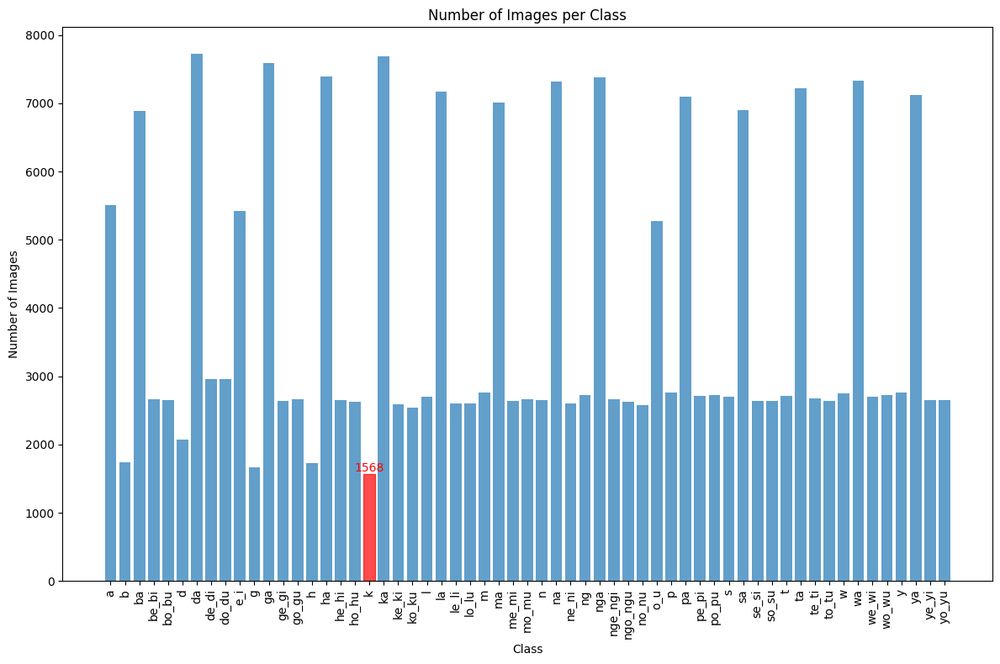

In [12]:
import matplotlib.pyplot as plt

# Visualization: Number of classes
plt.figure(figsize=(12, 8))
bars = plt.bar(class_counts.keys(), class_counts.values(), alpha=0.7)
plt.xticks(rotation=90)
plt.title("Number of Images per Class")
plt.xlabel("Class")
plt.ylabel("Number of Images")

# Highlight the class with the least number of images
for bar in bars:
  if bar.get_x() + bar.get_width() / 2 == list(class_counts.keys()).index(least_class):
    bar.set_color('r')
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{bar.get_height()}', ha='center', va='bottom', color='red')

plt.tight_layout()
plt.show()


In [14]:
import os

# Define the dataset path
dataset_path = r"D:\WORK\Baybayin App Project\dataset - Copy - Copy"

# Count all images in the folder and its subfolders
total_images = 0
for root, dirs, files in os.walk(dataset_path):
  total_images += len([f for f in files if f.endswith(('.jpg', '.png'))])

print(f"Total number of images in the dataset: {total_images}")

Total number of images in the dataset: 225972


In [15]:
import os
import random
import shutil
from tqdm import tqdm

# Paths
source_dir = r"D:\WORK\Baybayin App Project\dataset - Copy - Copy"
destination_dir = r"D:\WORK\Baybayin App Project\sampled_dataset_v1"

# Number of images per class
num_images_per_class = 1000

def create_sampled_dataset(source_dir, destination_dir, num_images_per_class):
    # Ensure the destination directory exists
    if not os.path.exists(destination_dir):
        os.makedirs(destination_dir)

    # Iterate through each subfolder in the source directory
    for class_folder in tqdm(os.listdir(source_dir), desc="Processing classes"):
        class_path = os.path.join(source_dir, class_folder)
        
        # Ensure the current item is a directory
        if os.path.isdir(class_path):
            # Create corresponding folder in the destination directory
            dest_class_path = os.path.join(destination_dir, class_folder)
            os.makedirs(dest_class_path, exist_ok=True)

            # Get a list of all image files in the current class folder
            image_files = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]
            
            # Randomly select the required number of images
            selected_files = random.sample(image_files, min(num_images_per_class, len(image_files)))

            # Copy the selected images to the destination class folder
            for file in selected_files:
                src_file = os.path.join(class_path, file)
                dest_file = os.path.join(dest_class_path, file)
                shutil.copy(src_file, dest_file)

if __name__ == "__main__":
    create_sampled_dataset(source_dir, destination_dir, num_images_per_class)


Processing classes: 100%|██████████| 59/59 [19:13<00:00, 19.56s/it]


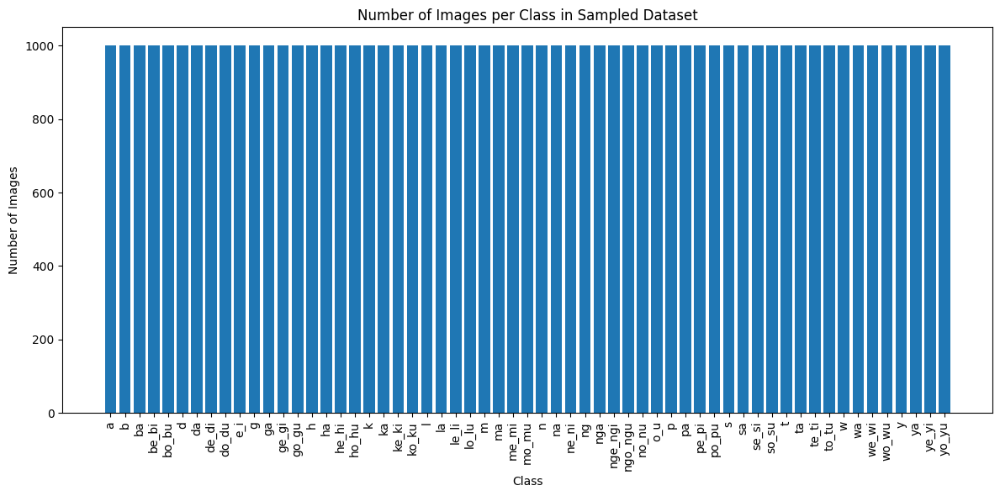

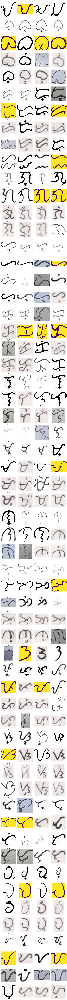

In [18]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

# Path to the sampled dataset
sampled_dir = r"D:\WORK\Baybayin App Project\sampled_dataset_v1"

def visualize_sampled_dataset(sampled_dir):
    # Collect information about the sampled dataset
    class_counts = {}
    sample_images = {}

    for class_folder in os.listdir(sampled_dir):
        class_path = os.path.join(sampled_dir, class_folder)
        if os.path.isdir(class_path):
            images = [os.path.join(class_path, f) for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]
            class_counts[class_folder] = len(images)
            # Randomly select 4 images for visualization
            sample_images[class_folder] = random.sample(images, min(4, len(images)))

    # Bar chart: Number of images per class
    plt.figure(figsize=(12, 6))
    plt.bar(class_counts.keys(), class_counts.values())
    plt.title("Number of Images per Class in Sampled Dataset")
    plt.xlabel("Class")
    plt.ylabel("Number of Images")
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

    # Grid visualization: Sample images from each class
    plt.figure(figsize=(12, len(sample_images) * 3))
    for idx, (class_name, images) in enumerate(sample_images.items()):
        for i, img_path in enumerate(images):
            plt.subplot(len(sample_images), 4, idx * 4 + i + 1)
            img = Image.open(img_path)
            plt.imshow(img)
            plt.axis("off")
            if i == 0:
                plt.title(class_name)
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    visualize_sampled_dataset(sampled_dir)


In [16]:
import os
import random
import shutil

def split_dataset_fixed(dataset_directory, output_directory):
    """
    Split the dataset with exactly 264 images per class into train (700), val (200), and test (100).
    """
    # Explicit counts
    train_count = 700
    val_count = 200
    test_count = 100

    # Ensure output directories exist
    train_dir = os.path.join(output_directory, "train")
    val_dir = os.path.join(output_directory, "val")
    test_dir = os.path.join(output_directory, "test")

    for directory in [train_dir, val_dir, test_dir]:
        if not os.path.exists(directory):
            os.makedirs(directory)

    # Loop through each class folder
    for class_folder in os.listdir(dataset_directory):
        class_path = os.path.join(dataset_directory, class_folder)

        if os.path.isdir(class_path):
            # Create corresponding subdirectories in train, val, and test folders
            for split_dir in [train_dir, val_dir, test_dir]:
                split_class_path = os.path.join(split_dir, class_folder)
                if not os.path.exists(split_class_path):
                    os.makedirs(split_class_path)

            # List all images in the class folder
            images = os.listdir(class_path)
            if len(images) != 1000:
                raise ValueError(f"Class '{class_folder}' does not have exactly 1000 images.")
            
            random.shuffle(images)

            # Split the images
            train_images = images[:train_count]
            val_images = images[train_count:train_count + val_count]
            test_images = images[train_count + val_count:train_count + val_count + test_count]

            # Move images to respective directories
            for image_file in train_images:
                shutil.copy(os.path.join(class_path, image_file), os.path.join(train_dir, class_folder, image_file))
            
            for image_file in val_images:
                shutil.copy(os.path.join(class_path, image_file), os.path.join(val_dir, class_folder, image_file))
            
            for image_file in test_images:
                shutil.copy(os.path.join(class_path, image_file), os.path.join(test_dir, class_folder, image_file))

if __name__ == "__main__":
    # Paths to the sampled dataset and output split directory
    sampled_dataset_directory = r"D:\WORK\Baybayin App Project\sampled_dataset_v1"
    output_split_directory = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1"

    # Split the dataset
    split_dataset_fixed(sampled_dataset_directory, output_split_directory)

    print("Dataset has been split into train (700), val (200), and test (100) sets.")


Dataset has been split into train (700), val (200), and test (100) sets.


In [8]:
import os

# Directory path
base_path = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1"
splits = ["train", "val", "test"]

# Function to rename .JPG to .jpg
def rename_jpg_to_lowercase(base_path, splits):
    for split in splits:
        split_path = os.path.join(base_path, split)
        if os.path.exists(split_path):
            for root, _, files in os.walk(split_path):
                for file in files:
                    if file.endswith(".JPG"):
                        old_path = os.path.join(root, file)
                        new_path = os.path.join(root, file.lower())  # Convert to lowercase
                        os.rename(old_path, new_path)
                        print(f"Renamed: {old_path} -> {new_path}")

# Rename all .JPG to .jpg
rename_jpg_to_lowercase(base_path, splits)

print("Renaming complete.")


Renamed: D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (103).JPG -> D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (103).jpg
Renamed: D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (11).JPG -> D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (11).jpg
Renamed: D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (112).JPG -> D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (112).jpg
Renamed: D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (114).JPG -> D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (114).jpg
Renamed: D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (115).JPG -> D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (115).jpg
Renamed: D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (12).JPG -> D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (12).jpg
Renamed: D:\WORK\Baybayin App Project\split_

In [9]:
import os
from collections import defaultdict

# Paths to the split dataset
new_dataset_path = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1"
splits = ["train", "val", "test"]

# Initialize a dictionary to store the count of images per split
split_counts = defaultdict(int)

# Iterate through each split directory
for split in splits:
    split_path = os.path.join(new_dataset_path, split)
    # Iterate through each class subdirectory
    for class_name in os.listdir(split_path):
        class_split_path = os.path.join(split_path, class_name)
        if os.path.isdir(class_split_path):
            # Count the number of images in the class subdirectory
            split_counts[split] += len([img for img in os.listdir(class_split_path) if img.endswith(('.jpg'))])

# Print the counts
for split, count in split_counts.items():
    print(f"{split}: {count} images")


train: 41300 images
val: 11800 images
test: 5900 images


In [1]:
# Adjusted script to count classes without saving to a non-existent path
import os
from collections import defaultdict
import pandas as pd

# Paths to the split dataset
base_path = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1"
splits = ["train", "val", "test"]

# Dictionary to store class counts per split
class_counts = {}

# Loop through each split (train, val, test)
for split in splits:
    split_path = os.path.join(base_path, split)
    class_counter = defaultdict(int)
    
    # Iterate through all files in the split directory
    if os.path.exists(split_path):
        for root, dirs, files in os.walk(split_path):
            for file in files:
                # Assume class is determined by the subfolder name
                class_name = os.path.basename(root)
                class_counter[class_name] += 1
    
    # Store counts for this split
    class_counts[split] = dict(class_counter)

# Convert to a DataFrame for better visualization
df = pd.DataFrame(class_counts).fillna(0).astype(int)

# Print the class counts
print("Class Counts Per Split:")
print(df)


Class Counts Per Split:
         train  val  test
a          700  200   100
b          700  200   100
ba         700  200   100
be_bi      700  200   100
bo_bu      700  200   100
d          700  200   100
da         700  200   100
de_di      700  200   100
do_du      700  200   100
e_i        700  200   100
g          700  200   100
ga         700  200   100
ge_gi      700  200   100
go_gu      700  200   100
h          700  200   100
ha         700  200   100
he_hi      700  200   100
ho_hu      700  200   100
k          700  200   100
ka         700  200   100
ke_ki      700  200   100
ko_ku      700  200   100
l          700  200   100
la         700  200   100
le_li      700  200   100
lo_lu      700  200   100
m          700  200   100
ma         700  200   100
me_mi      700  200   100
mo_mu      700  200   100
n          700  200   100
na         700  200   100
ne_ni      700  200   100
ng         700  200   100
nga        700  200   100
nge_ngi    700  200   100
ngo_ngu    700

In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import optuna
import os

# Paths to dataset folders
train_dir = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train"
val_dir = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1\val"
test_dir = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1\test"

# Image dimensions and batch size
IMG_HEIGHT, IMG_WIDTH = 128, 128
BATCH_SIZE = 32

# Data augmentation and preprocessing
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

val_datagen = ImageDataGenerator(rescale=1.0/255.0)

train_data = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_data = val_datagen.flow_from_directory(
    val_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)


c:\Users\rojgi\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Found 41300 images belonging to 59 classes.
Found 11800 images belonging to 59 classes.


In [4]:
# from tqdm import tqdm

# # Define the objective function for Optuna
# def objective(trial):
#     model = Sequential()

#     # Hyperparameters to tune
#     num_conv_layers = trial.suggest_int("num_conv_layers", 1, 3)
#     filter_count = trial.suggest_categorical("filter_count", [32, 64, 128])
#     kernel_size = trial.suggest_categorical("kernel_size", [3, 5])
#     dropout_rate = trial.suggest_float("dropout_rate", 0.2, 0.5)
#     learning_rate = trial.suggest_loguniform("learning_rate", 1e-4, 1e-2)

#     # Build CNN with dynamic hyperparameters
#     for _ in range(num_conv_layers):
#         model.add(Conv2D(filter_count, (kernel_size, kernel_size), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
#         model.add(MaxPooling2D((2, 2)))

#     model.add(Flatten())
#     model.add(Dropout(dropout_rate))
#     model.add(Dense(train_data.num_classes, activation='softmax'))

#     # Compile the model
#     optimizer = Adam(learning_rate=learning_rate)
#     model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

#  # Track the best validation accuracy and corresponding epoch
#     best_epoch = 0
#     best_val_accuracy = 0.0

#     for epoch in range(1, 31):  # Iterate through 1-30 epochs
#         history = model.fit(
#             train_data,
#             epochs=1,
#             validation_data=val_data,
#             verbose=0
#         )
#         val_accuracy = history.history['val_accuracy'][0]

#         # Update the best validation accuracy and epoch
#         if val_accuracy > best_val_accuracy:
#             best_val_accuracy = val_accuracy
#             best_epoch = epoch

#     # Log the best epoch for this trial
#     trial.set_user_attr("best_epoch", best_epoch)
#     return best_val_accuracy

# # Run Optuna optimization with progress bar
# class TQDMOptunaCallback(optuna.integration.TFKerasPruningCallback):
#     def __init__(self, iterator):
#         self.iterator = iterator

#     def __call__(self, study, trial):
#         self.iterator.update(1)


# study = optuna.create_study(direction="maximize")
# with tqdm(total=30) as pbar:
#     study.optimize(lambda trial: objective(trial), n_trials=30, callbacks=[TQDMOptunaCallback(pbar)])

# # Get the best hyperparameters
# print("Best Hyperparameters:", study.best_params)
# print("Best Epoch:", study.best_trial.user_attrs["best_epoch"])

# # Build and train the final model with best hyperparameters
# best_params = study.best_params

[I 2025-01-11 03:24:49,629] A new study created in memory with name: no-name-bcd98911-d023-47ba-90f9-8ca0a7ee1236
  0%|          | 0/30 [00:00<?, ?it/s]C:\Users\rojgi\AppData\Local\Temp\ipykernel_18168\2438023475.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-4, 1e-2)
[I 2025-01-11 05:22:10,773] Trial 0 finished with value: 0.8652542233467102 and parameters: {'num_conv_layers': 3, 'filter_count': 64, 'kernel_size': 3, 'dropout_rate': 0.27133583011380447, 'learning_rate': 0.00210976363926884}. Best is trial 0 with value: 0.8652542233467102.
 13%|█▎        | 4/30 [6:21:19<39:51:03, 5517.81s/it][W 2025-01-11 10:09:50,453] Trial 4 failed with parameters: {'num_conv_layers': 2, 'filter_count': 128, 'kernel_size': 5, 'dropout_rate': 0.22480594018451489, 'learning_rate

KeyboardInterrupt: 

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tqdm import tqdm
import optuna

# Check if GPU is available
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Set GPU memory growth to avoid over-allocating memory
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print("GPU is available and configured.")
    except RuntimeError as e:
        print(f"Error configuring GPU: {e}")
else:
    print("GPU is not available. Ensure TensorFlow is installed with GPU support.")

# Define the objective function for Optuna
def objective(trial):
    model = Sequential()

    # Hyperparameters to tune
    num_conv_layers = trial.suggest_int("num_conv_layers", 1, 3)
    filter_count = trial.suggest_categorical("filter_count", [64, 128])
    kernel_size = trial.suggest_categorical("kernel_size", [5])
    dropout_rate = trial.suggest_float("dropout_rate", 0.3, 0.5)
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-4, 1e-2)

    # Build CNN with dynamic hyperparameters
    for _ in range(num_conv_layers):
        model.add(Conv2D(filter_count, (kernel_size, kernel_size), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
        model.add(MaxPooling2D((2, 2)))

    model.add(Flatten())
    model.add(Dropout(dropout_rate))
    model.add(Dense(train_data.num_classes, activation='softmax'))

    # Compile the model
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    # Train the model
    history = model.fit(
        train_data,
        epochs=10,
        validation_data=val_data,
        verbose=0
    )

    # Return the validation accuracy
    val_accuracy = max(history.history['val_accuracy'])
    return val_accuracy

# Run Optuna optimization with a progress bar
class TQDMOptunaCallback(optuna.integration.TFKerasPruningCallback):
    def __init__(self, iterator):
        self.iterator = iterator

    def __call__(self, study, trial):
        self.iterator.update(1)

study = optuna.create_study(direction="maximize")
with tqdm(total=30) as pbar:
    study.optimize(lambda trial: objective(trial), n_trials=30, callbacks=[TQDMOptunaCallback(pbar)])

# Get the best hyperparameters
print("Best Hyperparameters:", study.best_params)

# Build and train the final model with the best hyperparameters
best_params = study.best_params


[I 2025-01-11 10:21:10,885] A new study created in memory with name: no-name-0b8cab58-2140-48b5-8678-e19302a92c36


GPU is available and configured.


  0%|          | 0/30 [00:00<?, ?it/s]C:\Users\rojgi\AppData\Local\Temp\ipykernel_15192\1313209444.py:30: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-4, 1e-2)
[I 2025-01-11 11:14:29,396] Trial 0 finished with value: 0.631779670715332 and parameters: {'num_conv_layers': 2, 'filter_count': 128, 'kernel_size': 5, 'dropout_rate': 0.364804450200695, 'learning_rate': 0.0015226671998777187}. Best is trial 0 with value: 0.631779670715332.
  3%|▎         | 1/30 [53:18<25:45:56, 3198.51s/it][W 2025-01-11 11:39:42,259] Trial 1 failed with parameters: {'num_conv_layers': 1, 'filter_count': 128, 'kernel_size': 3, 'dropout_rate': 0.20180664113384095, 'learning_rate': 0.0007831925572946737} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  F

KeyboardInterrupt: 

In [ ]:
final_model = Sequential()
for _ in range(best_params["num_conv_layers"]):
    final_model.add(Conv2D(best_params["filter_count"], (best_params["kernel_size"], best_params["kernel_size"]), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
    final_model.add(MaxPooling2D((2, 2)))

final_model.add(Flatten())
final_model.add(Dropout(best_params["dropout_rate"]))
final_model.add(Dense(train_data.num_classes, activation='softmax'))

final_model.compile(optimizer=Adam(learning_rate=best_params["learning_rate"]), loss='categorical_crossentropy', metrics=['accuracy'])

final_model.fit(
    train_data,
    epochs=20,
    validation_data=val_data
)

# Save the final model
final_model.save("final_cnn_model_v1.h5")

# Evaluate on the test set
test_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_data = test_datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

results = final_model.evaluate(test_data)
print(f"Test Loss: {results[0]}, Test Accuracy: {results[1]}")

In [1]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set hyperparameters
num_conv_layers = 3
filter_count = 64
kernel_size = 5
dropout_rate = 0.4224108606868052
learning_rate = 0.0007876708560116673
IMG_HEIGHT = 128  
IMG_WIDTH = 128  
BATCH_SIZE = 32   
train_dir = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train"
val_dir = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1\val"
test_dir = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1\test" 

# Initialize data generators
train_datagen = ImageDataGenerator(rescale=1.0/255.0)
val_datagen = ImageDataGenerator(rescale=1.0/255.0)

train_data = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_data = val_datagen.flow_from_directory(
    val_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

# Build the model
final_model = Sequential()
for _ in range(num_conv_layers):
    final_model.add(Conv2D(filter_count, (kernel_size, kernel_size), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
    final_model.add(MaxPooling2D((2, 2)))

final_model.add(Flatten())
final_model.add(Dropout(dropout_rate))
final_model.add(Dense(train_data.num_classes, activation='softmax'))

# Compile the model
final_model.compile(optimizer=Adam(learning_rate=learning_rate), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
final_model.fit(
    train_data,
    epochs=20,  # Adjust epochs as needed
    validation_data=val_data
)

# Save the final model
final_model.save("final_cnn_model_test.h5")

# Evaluate on the test set
test_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_data = test_datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

results = final_model.evaluate(test_data)
print(f"Test Loss: {results[0]}, Test Accuracy: {results[1]}")


Found 41300 images belonging to 59 classes.
Found 11800 images belonging to 59 classes.
Epoch 1/20
1291/1291 [==============================] - 68s 50ms/step - loss: 0.9137 - accuracy: 0.7475 - val_loss: 0.3794 - val_accuracy: 0.8859
Epoch 2/20
1291/1291 [==============================] - 61s 47ms/step - loss: 0.3100 - accuracy: 0.9021 - val_loss: 0.2800 - val_accuracy: 0.9178
Epoch 3/20
1291/1291 [==============================] - 62s 48ms/step - loss: 0.2064 - accuracy: 0.9346 - val_loss: 0.2180 - val_accuracy: 0.9382
Epoch 4/20
1291/1291 [==============================] - 61s 48ms/step - loss: 0.1539 - accuracy: 0.9496 - val_loss: 0.1999 - val_accuracy: 0.9452
Epoch 5/20
1291/1291 [==============================] - 62s 48ms/step - loss: 0.1182 - accuracy: 0.9614 - val_loss: 0.1959 - val_accuracy: 0.9497
Epoch 6/20
1291/1291 [==============================] - 63s 49ms/step - loss: 0.1017 - accuracy: 0.9665 - val_loss: 0.1931 - val_accuracy: 0.9519
Epoch 7/20
1291/1291 [==============

1/1 [==============================] - 0s 361ms/step


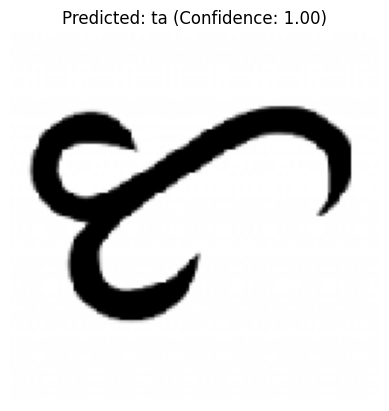

ta: 0.9997
ma: 0.0002
ga: 0.0000
te_ti: 0.0000
a: 0.0000
t: 0.0000
to_tu: 0.0000
ba: 0.0000
la: 0.0000
e_i: 0.0000
m: 0.0000
ho_hu: 0.0000
sa: 0.0000
de_di: 0.0000
da: 0.0000
y: 0.0000
he_hi: 0.0000
mo_mu: 0.0000
me_mi: 0.0000
nga: 0.0000
po_pu: 0.0000
pe_pi: 0.0000
do_du: 0.0000
wa: 0.0000
yo_yu: 0.0000
ha: 0.0000
h: 0.0000
ko_ku: 0.0000
na: 0.0000
ka: 0.0000
d: 0.0000
bo_bu: 0.0000
be_bi: 0.0000
ye_yi: 0.0000
ya: 0.0000
o_u: 0.0000
p: 0.0000
wo_wu: 0.0000
pa: 0.0000
ne_ni: 0.0000
nge_ngi: 0.0000
we_wi: 0.0000
le_li: 0.0000
g: 0.0000
ngo_ngu: 0.0000
ge_gi: 0.0000
ke_ki: 0.0000
no_nu: 0.0000
lo_lu: 0.0000
b: 0.0000
s: 0.0000
go_gu: 0.0000
k: 0.0000
se_si: 0.0000
ng: 0.0000
so_su: 0.0000
l: 0.0000
w: 0.0000
n: 0.0000


In [3]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt
import os

# Load the trained model
model = tf.keras.models.load_model("final_cnn_model_test.h5")

# Image dimensions
IMG_HEIGHT, IMG_WIDTH = 128, 128

# Function to preprocess and predict a new image
def predict_new_image(image_path):
    image = load_img(image_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
    image_array = img_to_array(image) / 255.0  # Normalize
    image_array = np.expand_dims(image_array, axis=0)  # Add batch dimension

    prediction = model.predict(image_array)
    predicted_class = np.argmax(prediction, axis=1)[0]
    confidence = prediction[0][predicted_class]

    class_labels = list(test_data.class_indices.keys())
    predicted_label = class_labels[predicted_class]

    # Display the image and prediction
    plt.imshow(image)
    plt.title(f"Predicted: {predicted_label} (Confidence: {confidence:.2f})")
    plt.axis('off')
    plt.show()

    # Display probabilities for all classes, ranked descending
    sorted_indices = np.argsort(prediction[0])[::-1]
    for i in sorted_indices:
        print(f"{class_labels[i]}: {prediction[0][i]:.4f}")

# Example usage
image_path = r"D:\WORK\Baybayin App Project\ta.jpg"  # Change this path to your image
predict_new_image(image_path)


1/1 [==============================] - 0s 88ms/step


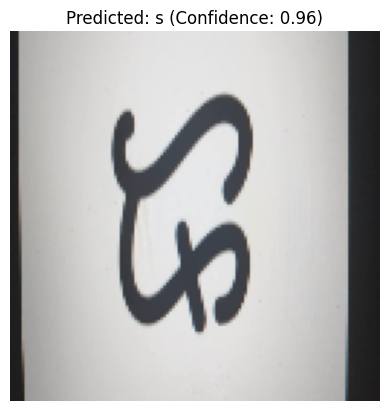

s: 0.9603
y: 0.0198
m: 0.0069
sa: 0.0056
se_si: 0.0055
na: 0.0013
pe_pi: 0.0005
k: 0.0000
w: 0.0000
ka: 0.0000
ba: 0.0000
ne_ni: 0.0000
la: 0.0000
a: 0.0000
b: 0.0000
te_ti: 0.0000
wa: 0.0000
me_mi: 0.0000
pa: 0.0000
no_nu: 0.0000
g: 0.0000
ga: 0.0000
n: 0.0000
we_wi: 0.0000
ke_ki: 0.0000
e_i: 0.0000
ma: 0.0000
to_tu: 0.0000
mo_mu: 0.0000
po_pu: 0.0000
he_hi: 0.0000
ng: 0.0000
p: 0.0000
nge_ngi: 0.0000
so_su: 0.0000
ta: 0.0000
lo_lu: 0.0000
t: 0.0000
nga: 0.0000
wo_wu: 0.0000
l: 0.0000
ye_yi: 0.0000
ngo_ngu: 0.0000
yo_yu: 0.0000
le_li: 0.0000
ha: 0.0000
d: 0.0000
de_di: 0.0000
be_bi: 0.0000
ge_gi: 0.0000
ho_hu: 0.0000
o_u: 0.0000
go_gu: 0.0000
ko_ku: 0.0000
do_du: 0.0000
ya: 0.0000
h: 0.0000
da: 0.0000
bo_bu: 0.0000


In [20]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt
import os

# Load the trained model
model = tf.keras.models.load_model("final_cnn_model_test.h5")

# Image dimensions
IMG_HEIGHT, IMG_WIDTH = 128, 128

# Function to preprocess and predict a new image
def predict_new_image(image_path):
    image = load_img(image_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
    image_array = img_to_array(image) / 255.0  # Normalize
    image_array = np.expand_dims(image_array, axis=0)  # Add batch dimension

    prediction = model.predict(image_array)
    predicted_class = np.argmax(prediction, axis=1)[0]
    confidence = prediction[0][predicted_class]

    class_labels = list(test_data.class_indices.keys())
    predicted_label = class_labels[predicted_class]

    # Display the image and prediction
    plt.imshow(image)
    plt.title(f"Predicted: {predicted_label} (Confidence: {confidence:.2f})")
    plt.axis('off')
    plt.show()

    # Display probabilities for all classes, ranked descending
    sorted_indices = np.argsort(prediction[0])[::-1]
    for i in sorted_indices:
        print(f"{class_labels[i]}: {prediction[0][i]:.4f}")

# Example usage
image_path = r"D:\WORK\Baybayin App Project\ra.jpg"  # Change this path to your image
predict_new_image(image_path)


  1/185 [..............................] - ETA: 23s

185/185 [==============================] - 6s 31ms/step


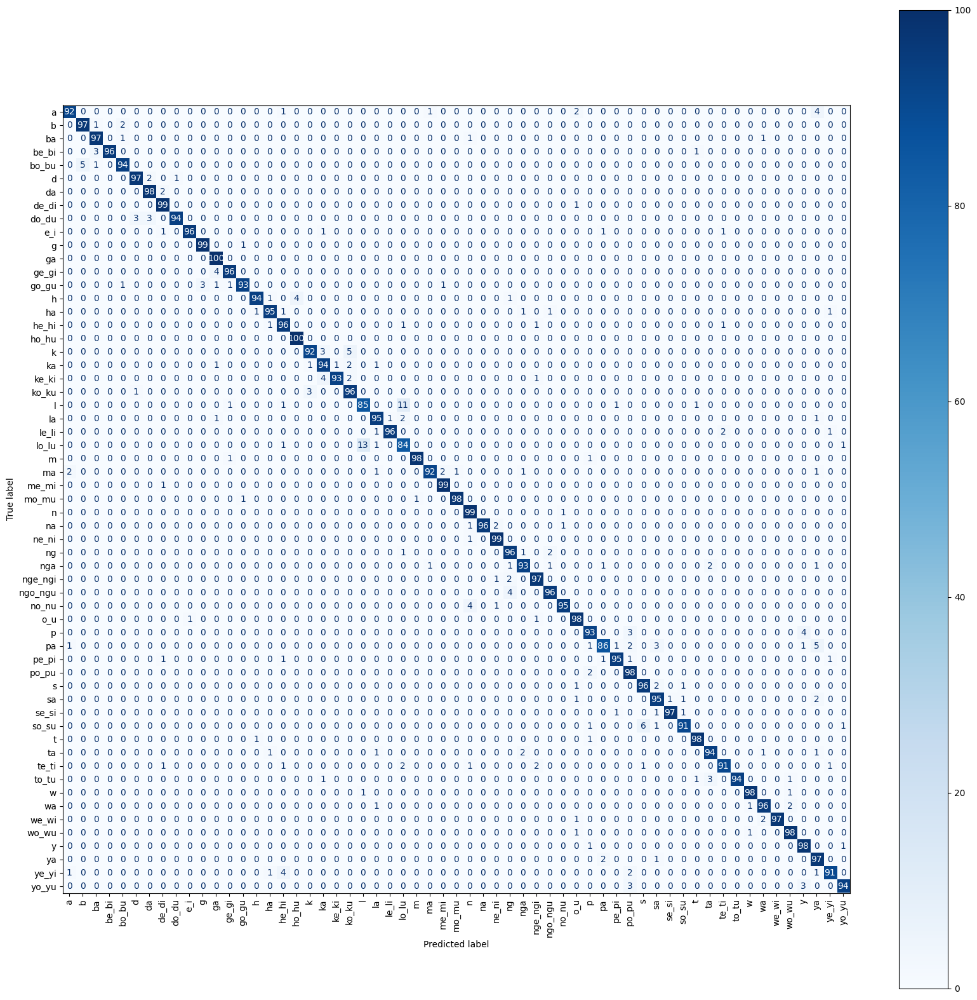

In [24]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Get the true labels and predicted labels
true_labels = test_data.classes
predictions = final_model.predict(test_data)
predicted_labels = np.argmax(predictions, axis=1)

# Compute the confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Display the confusion matrix
plt.figure(figsize=(20, 20))  # Adjust the figure size as needed
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_data.class_indices.keys())
disp.plot(cmap=plt.cm.Blues, ax=plt.gca())
plt.xticks(rotation=90)
plt.show()


In [6]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Get the true labels and predicted labels
true_labels = test_data.classes
predictions = final_model.predict(test_data)
predicted_labels = np.argmax(predictions, axis=1)

# Calculate accuracy
accuracy = accuracy_score(true_labels, predicted_labels)

# Calculate precision, recall, and F1-score
precision = precision_score(true_labels, predicted_labels, average='weighted')
recall = recall_score(true_labels, predicted_labels, average='weighted')
f1 = f1_score(true_labels, predicted_labels, average='weighted')

# Calculate AUC
# Note: AUC is typically calculated for binary classification. For multi-class, you can use the 'ovr' (one-vs-rest) approach.
auc = roc_auc_score(true_labels, predictions, multi_class='ovr')

print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print(f"AUC: {auc}")

185/185 [==============================] - 6s 30ms/step
Accuracy: 0.016610169491525422
Precision: 0.016521150811553326
Recall: 0.016610169491525422
F1-Score: 0.016552148284526766
AUC: 0.49786548801870245


In [7]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping

# Set hyperparameters
num_conv_layers = 3
filter_count = 64
kernel_size = 5
dropout_rate = 0.4224108606868052
learning_rate = 0.0007876708560116673
IMG_HEIGHT = 128  
IMG_WIDTH = 128  
BATCH_SIZE = 32   
train_dir = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train"
val_dir = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1\val"
test_dir = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1\test" 

# Initialize data generators
train_datagen = ImageDataGenerator(rescale=1.0/255.0)
val_datagen = ImageDataGenerator(rescale=1.0/255.0)

train_data = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_data = val_datagen.flow_from_directory(
    val_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

# Build the model
final_model = Sequential()
for _ in range(num_conv_layers):
    final_model.add(Conv2D(filter_count, (kernel_size, kernel_size), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
    final_model.add(MaxPooling2D((2, 2)))

final_model.add(Flatten())
final_model.add(Dropout(dropout_rate))
final_model.add(Dense(train_data.num_classes, activation='softmax'))

# Compile the model
final_model.compile(optimizer=Adam(learning_rate=learning_rate), loss='categorical_crossentropy', metrics=['accuracy'])

# Define early stopping callback
early_stop = EarlyStopping(
    monitor='val_loss',  # Metric to monitor
    patience=5,          # Number of epochs with no improvement before stopping
    restore_best_weights=True  # Restore the best weights after stopping
)

# Train the model with early stopping
final_model.fit(
    train_data,
    epochs=20,  # Max epochs
    validation_data=val_data,
    callbacks=[early_stop]  # Include the early stopping callback
)

# Save the final model
final_model.save("final_cnn_model_test_EARLYSTOP.h5")

# Evaluate on the test set
test_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_data = test_datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

results = final_model.evaluate(test_data)
print(f"Test Loss: {results[0]}, Test Accuracy: {results[1]}")
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print(f"AUC: {auc}")


Found 41300 images belonging to 59 classes.
Found 11800 images belonging to 59 classes.
Epoch 1/20
1291/1291 [==============================] - 64s 49ms/step - loss: 1.0572 - accuracy: 0.7127 - val_loss: 0.4553 - val_accuracy: 0.8680
Epoch 2/20
1291/1291 [==============================] - 67s 52ms/step - loss: 0.4058 - accuracy: 0.8726 - val_loss: 0.3154 - val_accuracy: 0.9049
Epoch 3/20
1291/1291 [==============================] - 66s 51ms/step - loss: 0.2955 - accuracy: 0.9058 - val_loss: 0.2634 - val_accuracy: 0.9216
Epoch 4/20
1291/1291 [==============================] - 67s 52ms/step - loss: 0.2319 - accuracy: 0.9241 - val_loss: 0.2260 - val_accuracy: 0.9360
Epoch 5/20
1291/1291 [==============================] - 70s 55ms/step - loss: 0.1957 - accuracy: 0.9359 - val_loss: 0.2067 - val_accuracy: 0.9449
Epoch 6/20
1291/1291 [==============================] - 67s 52ms/step - loss: 0.1641 - accuracy: 0.9452 - val_loss: 0.1948 - val_accuracy: 0.9467
Epoch 7/20
1291/1291 [==============

In [8]:
from sklearn.metrics import classification_report, confusion_matrix

y_true = test_data.classes
y_pred = final_model.predict(test_data)
y_pred_classes = np.argmax(y_pred, axis=1)

print(classification_report(y_true, y_pred_classes))

185/185 [==============================] - 6s 30ms/step
              precision    recall  f1-score   support

           0       0.04      0.04      0.04       100
           1       0.01      0.01      0.01       100
           2       0.00      0.00      0.00       100
           3       0.04      0.04      0.04       100
           4       0.02      0.02      0.02       100
           5       0.04      0.04      0.04       100
           6       0.01      0.01      0.01       100
           7       0.02      0.02      0.02       100
           8       0.00      0.00      0.00       100
           9       0.03      0.03      0.03       100
          10       0.01      0.01      0.01       100
          11       0.01      0.01      0.01       100
          12       0.01      0.01      0.01       100
          13       0.02      0.02      0.02       100
          14       0.00      0.00      0.00       100
          15       0.02      0.02      0.02       100
          16       0.02  

In [9]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import numpy as np

# Get true labels and predictions
y_true = test_data.classes
y_pred = final_model.predict(test_data)
y_pred_classes = np.argmax(y_pred, axis=1)

# Calculate metrics
accuracy = accuracy_score(y_true, y_pred_classes)
precision = precision_score(y_true, y_pred_classes, average='macro')
recall = recall_score(y_true, y_pred_classes, average='macro')
f1 = f1_score(y_true, y_pred_classes, average='macro')
# AUC computation requires binary/multilabel probabilities
auc = roc_auc_score(y_true, y_pred, multi_class='ovr')

print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print(f"AUC: {auc}")


185/185 [==============================] - 6s 30ms/step
Accuracy: 0.01711864406779661
Precision: 0.017035447689076923
Recall: 0.01711864406779661
F1-Score: 0.0170684581245272
AUC: 0.49742101110461706


In [10]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import numpy as np

# Set hyperparameters
num_conv_layers = 3
filter_count = 64
kernel_size = 5
dropout_rate = 0.4224108606868052
learning_rate = 0.0007876708560116673
IMG_HEIGHT = 128  
IMG_WIDTH = 128  
BATCH_SIZE = 32   
train_dir = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train"
val_dir = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1\val"
test_dir = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1\test"

# Initialize data generators
train_datagen = ImageDataGenerator(rescale=1.0/255.0)
val_datagen = ImageDataGenerator(rescale=1.0/255.0)

train_data = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_data = val_datagen.flow_from_directory(
    val_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

# Build the model
final_model = Sequential()
for i in range(num_conv_layers):
    if i == 0:
        final_model.add(Conv2D(filter_count, (kernel_size, kernel_size), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
    else:
        final_model.add(Conv2D(filter_count, (kernel_size, kernel_size), activation='relu'))
    final_model.add(MaxPooling2D((2, 2)))

final_model.add(Flatten())
final_model.add(Dropout(dropout_rate))
final_model.add(Dense(train_data.num_classes, activation='softmax'))

# Compile the model
final_model.compile(optimizer=Adam(learning_rate=learning_rate), loss='categorical_crossentropy', metrics=['accuracy'])

# Define early stopping callback
early_stop = EarlyStopping(
    monitor='val_loss',  
    patience=5,         
    restore_best_weights=True  
)

# Train the model with early stopping
final_model.fit(
    train_data,
    epochs=20,
    validation_data=val_data,
    callbacks=[early_stop]
)

# Save the final model
final_model.save("test_EARLYSTOP.h5")

# Evaluate on the test set
test_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_data = test_datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

results = final_model.evaluate(test_data)
print(f"Test Loss: {results[0]}, Test Accuracy: {results[1]}")

# Calculate metrics
y_true = test_data.classes
y_pred = final_model.predict(test_data)
y_pred_classes = np.argmax(y_pred, axis=1)

accuracy = accuracy_score(y_true, y_pred_classes)
precision = precision_score(y_true, y_pred_classes, average='macro')
recall = recall_score(y_true, y_pred_classes, average='macro')
f1 = f1_score(y_true, y_pred_classes, average='macro')
auc = roc_auc_score(y_true, y_pred, multi_class='ovr')

print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print(f"AUC: {auc}")


Found 41300 images belonging to 59 classes.
Found 11800 images belonging to 59 classes.
Epoch 1/20
1291/1291 [==============================] - 89s 68ms/step - loss: 0.9230 - accuracy: 0.7493 - val_loss: 0.3851 - val_accuracy: 0.8891
Epoch 2/20
1291/1291 [==============================] - 57s 44ms/step - loss: 0.2906 - accuracy: 0.9089 - val_loss: 0.2938 - val_accuracy: 0.9131
Epoch 3/20
1291/1291 [==============================] - 58s 45ms/step - loss: 0.1782 - accuracy: 0.9424 - val_loss: 0.2288 - val_accuracy: 0.9364
Epoch 4/20
1291/1291 [==============================] - 59s 46ms/step - loss: 0.1240 - accuracy: 0.9589 - val_loss: 0.2228 - val_accuracy: 0.9440
Epoch 5/20
1291/1291 [==============================] - 63s 48ms/step - loss: 0.0956 - accuracy: 0.9673 - val_loss: 0.2286 - val_accuracy: 0.9488
Epoch 6/20
1291/1291 [==============================] - 68s 53ms/step - loss: 0.0784 - accuracy: 0.9737 - val_loss: 0.1905 - val_accuracy: 0.9514
Epoch 7/20
1291/1291 [==============

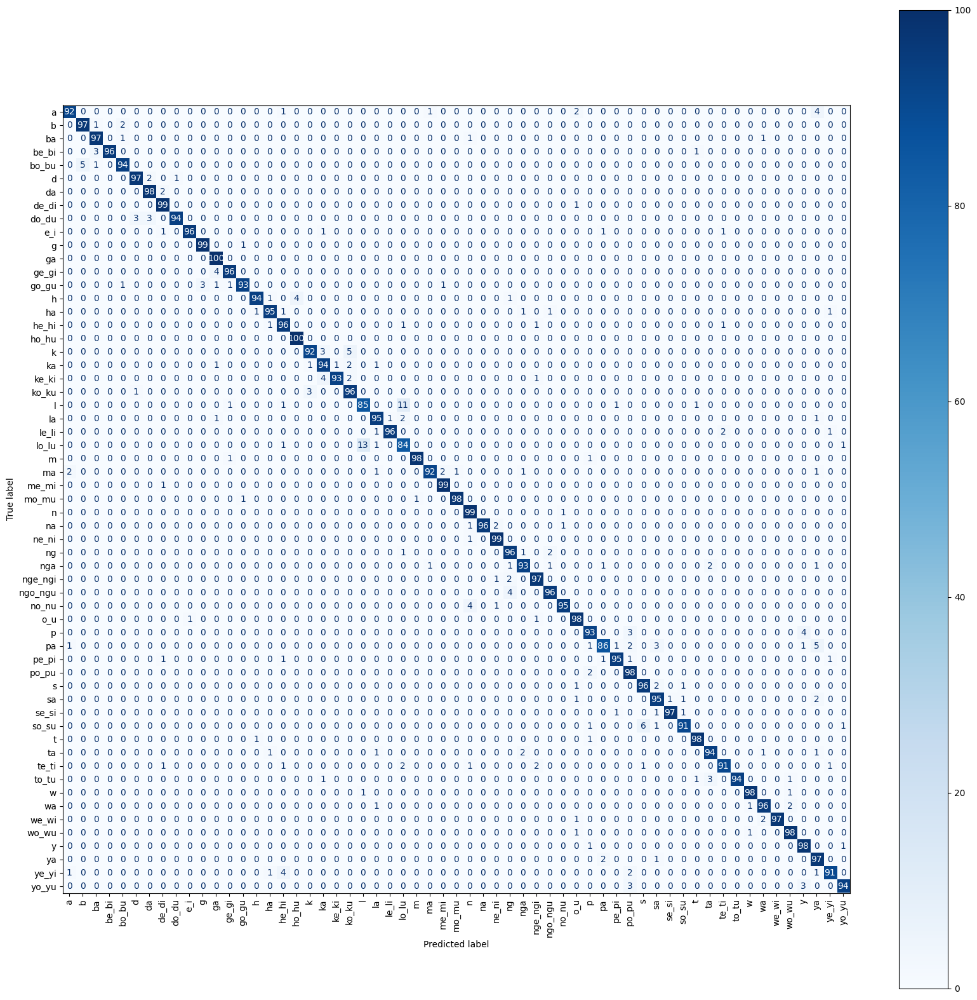

In [19]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Display the confusion matrix
plt.figure(figsize=(20, 20))  # Adjust the figure size as needed
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues, ax=plt.gca())
plt.xticks(rotation=90)
plt.show()

Found 5900 images belonging to 59 classes.
185/185 [==============================] - 6s 30ms/step


<Figure size 2000x2000 with 0 Axes>

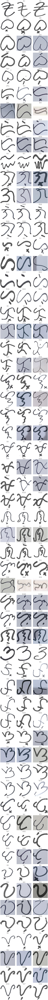

In [11]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import matplotlib.pyplot as plt

# Paths to dataset folders
test_dir = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1\test"

# Image dimensions and batch size
IMG_HEIGHT, IMG_WIDTH = 128, 128
BATCH_SIZE = 32

# Data preprocessing for the test set
test_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_data = test_datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# Load the trained model
model = tf.keras.models.load_model("test_EARLYSTOP.h5")

# Generate predictions
predictions = model.predict(test_data)
y_pred = np.argmax(predictions, axis=1)
y_true = test_data.classes
class_labels = list(test_data.class_indices.keys())

# Visualize 3 predictions per class
plt.figure(figsize=(20, 20))
class_samples = {class_name: 0 for class_name in class_labels}
num_classes = len(class_labels)
samples_per_class = 3

rows = samples_per_class * num_classes // 3  # Adjust rows for better size
cols = 3
plt.figure(figsize=(cols * 5, rows * 5))

index = 0
for i, (img_batch, _) in enumerate(test_data):
    for j in range(img_batch.shape[0]):
        true_label = class_labels[y_true[index]]
        pred_label = class_labels[y_pred[index]]

        # Show only if we haven't reached the sample count for this class
        if class_samples[true_label] < samples_per_class:
            plt.subplot(rows, cols, sum(class_samples.values()) + 1)
            plt.imshow(img_batch[j])
            plt.title(f"True: {true_label}\nPred: {pred_label}")
            plt.axis('off')

            class_samples[true_label] += 1
            if sum(class_samples.values()) >= rows * cols:
                break
        index += 1
    if sum(class_samples.values()) >= rows * cols:
        break

plt.tight_layout()
plt.show()


1/1 [==============================] - 0s 96ms/step


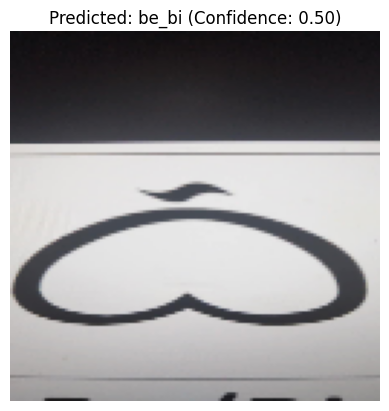

be_bi: 0.5023
da: 0.3707
e_i: 0.0810
de_di: 0.0237
ke_ki: 0.0121
k: 0.0065
p: 0.0011
do_du: 0.0006
ngo_ngu: 0.0006
d: 0.0004
ka: 0.0003
he_hi: 0.0002
nge_ngi: 0.0002
ng: 0.0001
ko_ku: 0.0001
mo_mu: 0.0000
pe_pi: 0.0000
h: 0.0000
nga: 0.0000
po_pu: 0.0000
bo_bu: 0.0000
g: 0.0000
ne_ni: 0.0000
a: 0.0000
b: 0.0000
ba: 0.0000
me_mi: 0.0000
te_ti: 0.0000
t: 0.0000
o_u: 0.0000
ga: 0.0000
we_wi: 0.0000
ho_hu: 0.0000
ma: 0.0000
ta: 0.0000
ha: 0.0000
ge_gi: 0.0000
s: 0.0000
to_tu: 0.0000
go_gu: 0.0000
y: 0.0000
so_su: 0.0000
se_si: 0.0000
na: 0.0000
w: 0.0000
n: 0.0000
pa: 0.0000
m: 0.0000
sa: 0.0000
wo_wu: 0.0000
l: 0.0000
wa: 0.0000
no_nu: 0.0000
lo_lu: 0.0000
yo_yu: 0.0000
le_li: 0.0000
ye_yi: 0.0000
la: 0.0000
ya: 0.0000


In [17]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt
import os

# Load the trained model
model = tf.keras.models.load_model("test_EARLYSTOP.h5")

# Image dimensions
IMG_HEIGHT, IMG_WIDTH = 128, 128

# Function to preprocess and predict a new image
def predict_new_image(image_path):
    image = load_img(image_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
    image_array = img_to_array(image) / 255.0  # Normalize
    image_array = np.expand_dims(image_array, axis=0)  # Add batch dimension

    prediction = model.predict(image_array)
    predicted_class = np.argmax(prediction, axis=1)[0]
    confidence = prediction[0][predicted_class]

    class_labels = list(test_data.class_indices.keys())
    predicted_label = class_labels[predicted_class]

    # Display the image and prediction
    plt.imshow(image)
    plt.title(f"Predicted: {predicted_label} (Confidence: {confidence:.2f})")
    plt.axis('off')
    plt.show()

    # Display probabilities for all classes, ranked descending
    sorted_indices = np.argsort(prediction[0])[::-1]
    for i in sorted_indices:
        print(f"{class_labels[i]}: {prediction[0][i]:.4f}")

# Example usage
image_path = r"D:\WORK\Baybayin App Project\be.jpg"  # Change this path to your image
predict_new_image(image_path)
